#Plant Disease Classification using CNNs

In this Colab notebook, we will explore the classification of plant conditions (Rust, Powdery, Healthy) using Convolutional Neural Network (CNN) models. Our goal is to build a model that achieves high accuracy in predicting these conditions from images of plants.


**Dataset:**

For this project, we will utilize the Plant Disease Recognition dataset curated by rashikrahmanpritom, which is available on Kaggle. You can access the dataset using the following link: https://www.kaggle.com/datasets/rashikrahmanpritom/plant-disease-recognition-dataset


First we download the files from kaggle

In [ ]:
#Use the Kaggle API to download the dataset
#!kaggle datasets download -d rashikrahmanpritom/plant-disease-recognition-dataset

Dataset URL: https://www.kaggle.com/datasets/rashikrahmanpritom/plant-disease-recognition-dataset
License(s): CC0-1.0
100% 1.25G/1.25G [00:47<00:00, 29.1MB/s]
100% 1.25G/1.25G [00:47<00:00, 28.5MB/s]


In [ ]:
# Unzip the downloaded file
#!unzip -q plant-disease-recognition-dataset.zip -d plant-disease-dataset

We import our libraries

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
from skimage.transform import resize
import tensorflow as tf
import tensorflow.keras.layers as tfl

from tensorflow.keras.preprocessing import image_dataset_from_directory
from tensorflow.keras.layers import RandomFlip, RandomRotation, RandomZoom, RandomContrast, RandomBrightness
from tensorflow.keras.models import Sequential
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.preprocessing import image
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense


Now we load our image folders

In [ ]:
BATCH_SIZE = 16
IMG_SIZE = (256,256)
directory = "/content/plant-disease-dataset/"
train_data = image_dataset_from_directory(directory + "Train/Train/",
                                             shuffle=True,
                                             batch_size=BATCH_SIZE,
                                             image_size=IMG_SIZE,
                                             )
validation_data = image_dataset_from_directory(directory + "Validation/Validation/",
                                             shuffle=True,
                                             batch_size=BATCH_SIZE,
                                             image_size=IMG_SIZE,
                                             )
test_data = image_dataset_from_directory(directory + "Test/Test/",
                                             shuffle=True,
                                             batch_size=BATCH_SIZE,
                                             image_size=IMG_SIZE,
                                             )

Found 1322 files belonging to 3 classes.
Found 60 files belonging to 3 classes.
Found 150 files belonging to 3 classes.


We will plot how many images do we have in each folder

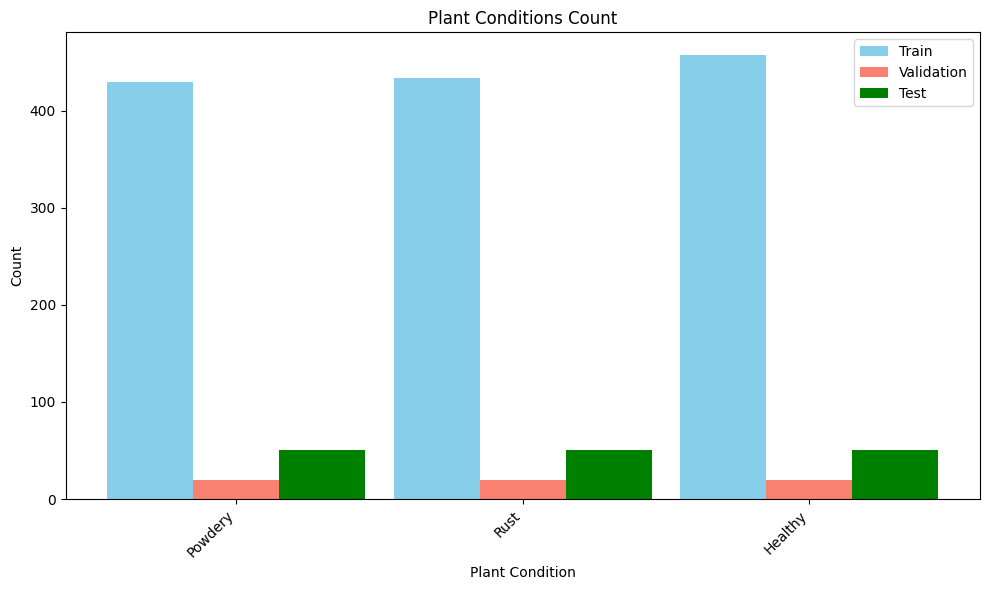

In [ ]:
train_folder = directory + "Train/Train/"
validation_folder = directory + "Validation/Validation/"
test_folder = directory + "Test/Test/"

train_counts = {}
val_counts = {}
test_counts = {}

# Function to get file extension
def get_extension(filename):
    return os.path.splitext(filename)[1]

# Iterate over train folder
for folder in os.listdir(train_folder):
    folder_path = os.path.join(train_folder, folder)
    if os.path.isdir(folder_path):
        train_counts[folder] = sum(1 for file in os.listdir(folder_path) if get_extension(file).lower() in ['.jpg', '.jpeg', '.png'])

# Iterate over validation folder
for folder in os.listdir(validation_folder):
    folder_path = os.path.join(validation_folder, folder)
    if os.path.isdir(folder_path):
        val_counts[folder] = sum(1 for file in os.listdir(folder_path) if get_extension(file).lower() in ['.jpg', '.jpeg', '.png'])

# Iterate over test folder
for folder in os.listdir(test_folder):
    folder_path = os.path.join(test_folder, folder)
    if os.path.isdir(folder_path):
        test_counts[folder] = sum(1 for file in os.listdir(folder_path) if get_extension(file).lower() in ['.jpg', '.jpeg', '.png'])

# Convert dictionaries to DataFrames
train_df = pd.DataFrame(list(train_counts.items()), columns=['plant', 'Train Count'])
val_df = pd.DataFrame(list(val_counts.items()), columns=['plant', 'Validation Count'])
test_df = pd.DataFrame(list(test_counts.items()), columns=['plant', 'Test Count'])

# Merge DataFrames
merged_df = pd.merge(train_df, val_df, on='plant', how='outer').merge(test_df, on='plant', how='outer').fillna(0)

# Plotting the bar graph
plt.figure(figsize=(10, 6))
bar_width = 0.3
index = merged_df.index
train_bars = plt.bar(index - bar_width, merged_df['Train Count'], bar_width, label='Train', color='skyblue')
val_bars = plt.bar(index, merged_df['Validation Count'], bar_width, label='Validation', color='salmon')
test_bars = plt.bar(index + bar_width, merged_df['Test Count'], bar_width, label='Test', color='green')

plt.xlabel('Plant Condition')
plt.ylabel('Count')
plt.title('Plant Conditions Count')
plt.xticks(index, merged_df['plant'], rotation=45, ha='right')
plt.legend()
plt.tight_layout()
plt.show()

Now, let's print the images from our folders to see what these plant conditions look like.

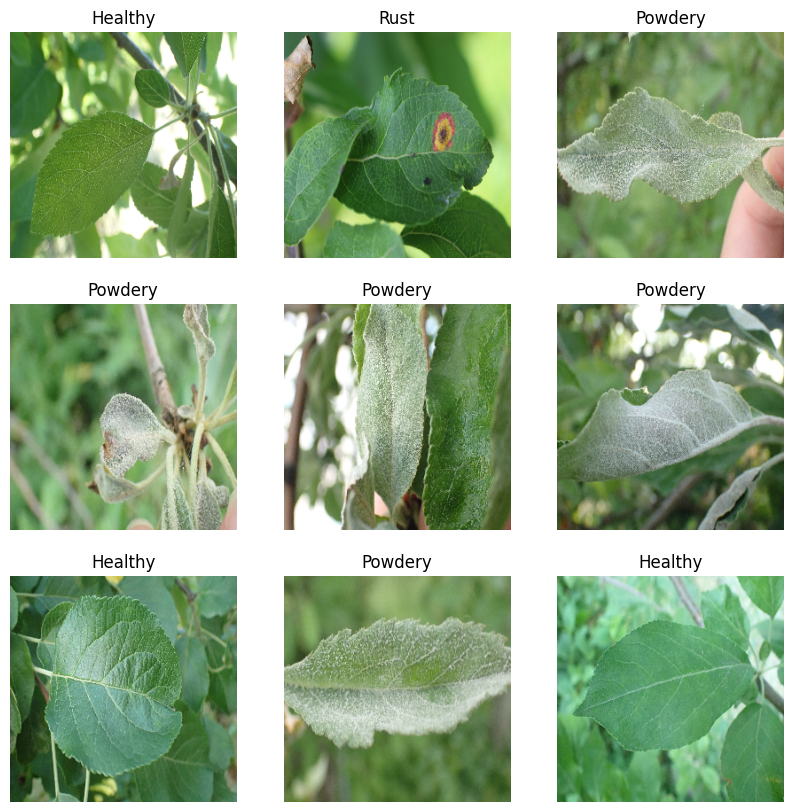

In [ ]:
class_names = train_data.class_names

plt.figure(figsize=(10, 10))
for images, labels in train_data.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")

#Data Augmentation

We will create a resizing_and_rescaling and data_augmentation variables

In [ ]:
resizing_and_rescaling = tf.keras.Sequential([
    tf.keras.layers.experimental.preprocessing.Resizing(256,256),
    tf.keras.layers.experimental.preprocessing.Rescaling(1.0/255)
])

In [ ]:
def data_augmenter():
  data_augmentation = tf.keras.Sequential([
            RandomFlip("horizontal"),  # Randomly flip images horizontally
            RandomRotation(factor=0.1),  # Randomly rotate images by a factor of 0.1 (10% of 360 degrees)
            RandomZoom(height_factor=0.2, width_factor=0.2),  # Randomly zoom into images by 20%
            RandomContrast(factor=0.2),  # Randomly adjust contrast by a factor of 0.2
            RandomBrightness(factor=0.2),  # Randomly adjust brightness by a factor of 0.2
        ])
  return data_augmentation

We print and image with the data augmentations we selected to see how the image changes

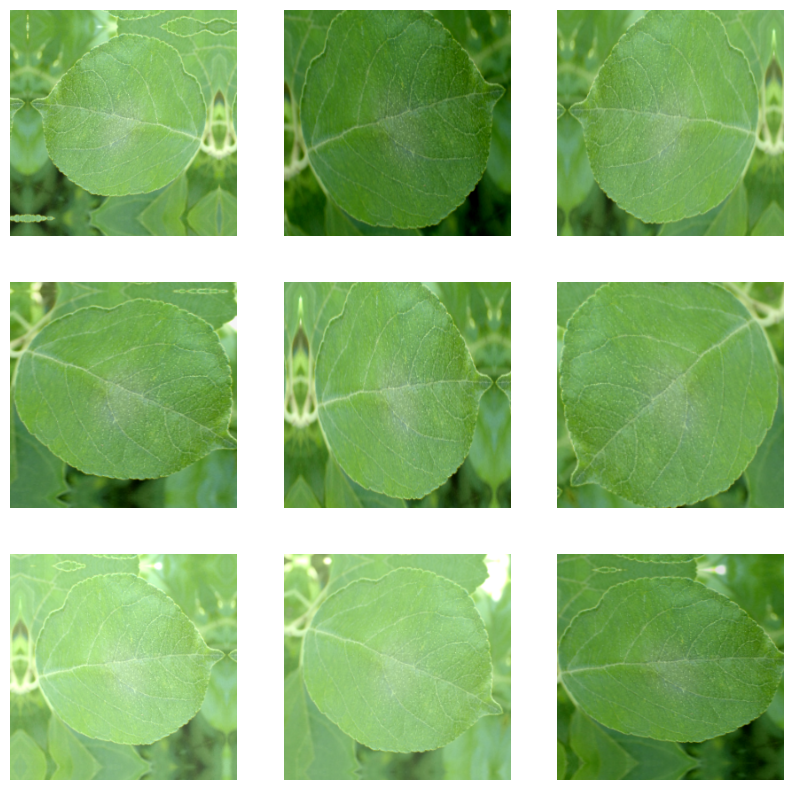

In [ ]:
# Create data augmentation model
data_augmentation = data_augmenter()

# Visualize augmented images
for image, _ in train_data.take(1):
    plt.figure(figsize=(10, 10))
    first_image = image[0]
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        augmented_image = data_augmentation(tf.expand_dims(first_image, 0))
        plt.imshow(augmented_image[0] / 255)
        plt.axis('off')

plt.show()

# Starting VGG16

VGG16 is a deep convolutional neural network architecture proposed by the Visual Geometry Group (VGG) at the University of Oxford. It is characterized by its simplicity and uniform architecture, consisting of 16 weight layers, including convolutional and fully connected layers. VGG16 is widely used for image classification tasks due to its effectiveness and ease of understanding. It has been pre-trained on large-scale image datasets such as ImageNet and can be fine-tuned for various computer vision applications.

![VGG16 and VGG19 architecture](https://www.researchgate.net/publication/353225711/figure/fig5/AS:1115969611141127@1643079297312/VGG16-and-VGG19-architecture-with-extra-layers-added-at-the-end-for-fine-tuning-on.png)



In [ ]:
preprocess_input = tf.keras.applications.vgg16.preprocess_input

In [ ]:
base_model = tf.keras.applications.VGG16(input_shape=(256,256,3),
                                               include_top=False,
                                               weights='imagenet',
                                               pooling='max',
                                               classes=3,
                                               classifier_activation='relu')

58889256/58889256 [==============================] - 0s 0us/step


In [ ]:
base_model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 256, 256, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 256, 256, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 128, 128, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 128, 128, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 128, 128, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 64, 64, 128)       0     

In [ ]:
# Get the number of layers
num_layers = len(base_model.layers)

print("Number of layers in VGG16:", num_layers)

Number of layers in VGG16: 20


In [ ]:
# Freeze VGG16 model
base_model.trainable = False

# Plant model with VGG16

I chose to use the VGG16 convolutional neural network (CNN) as the base model for several reasons:

 *   **Feature Extraction:** VGG16 is a powerful pre-trained CNN that has been trained on large-scale image datasets like ImageNet. By using VGG16 as the base model, we can leverage the features learned by the model's convolutional layers for our specific task of classifying plant conditions.

 *   **Transfer Learning:** Transfer learning allows us to use knowledge gained from solving one problem and apply it to a different but related problem. By fine-tuning the pre-trained VGG16 model on our dataset, we can adapt its learned representations to our specific classification task. This can lead to faster convergence and better performance, especially when we have limited data.

 *   **Model Complexity:** VGG16 strikes a balance between model complexity and performance. It is not as deep as some newer architectures like ResNet or DenseNet, which can be advantageous when dealing with limited computational resources or smaller datasets. Additionally, VGG16's architecture is relatively simple and easy to understand, making it suitable for educational purposes or when transparency in model architecture is desired.





The constructed model is a Sequential model that consists of the following layers:

 *   **Preprocessing Layers:** resizing_and_rescaling and data_augmentation layers are included to preprocess the input images by resizing them to a fixed size and applying data augmentation techniques like random rotations, flips, and zooms to increase the robustness of the model.

 *   **Base Model (VGG16):** The pre-trained VGG16 model serves as the base convolutional backbone. We use this model to extract meaningful features from the input images.

 *   **Batch Normalization:** Batch normalization is applied to normalize the activations of the previous layer, which can help in stabilizing and accelerating the training process.

 *   **Dense Layers:** Two fully connected dense layers with ReLU activation functions are added on top of the base model. The first dense layer consists of 256 units, which helps in learning complex patterns in the extracted features. The final dense layer consists of 3 units with a softmax activation function, which outputs the probability distribution over the three classes (Rust, Powdery, Healthy).

This model architecture aims to achieve high accuracy and robustness in classifying plant conditions using the VGG16 backbone combined with appropriate preprocessing and regularization techniques.

In [ ]:
IMG_SIZE = 256
CHANNELS = 3
input_shape = (BATCH_SIZE, IMG_SIZE, IMG_SIZE, CHANNELS)

model = tf.keras.models.Sequential([
    resizing_and_rescaling,
    data_augmentation,
    base_model,

    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dense(units=256, activation='relu'),
    tf.keras.layers.Dense(units=3, activation='softmax')
])

model.build(input_shape=input_shape)

In [ ]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (16, 256, 256, 3)         0         
                                                                 
 sequential_1 (Sequential)   (None, 256, 256, 3)       0         
                                                                 
 vgg16 (Functional)          (None, 512)               14714688  
                                                                 
 batch_normalization (Batch  (16, 512)                 2048      
 Normalization)                                                  
                                                                 
 dense (Dense)               (16, 256)                 131328    
                                                                 
 dense_1 (Dense)             (16, 3)                   771       
                                                      

In [ ]:
# Define the initial learning rate
base_learning_rate = 0.001

# Compile the model with the adjusted initial learning rate and metrics
model.compile(optimizer=tf.keras.optimizers.Nadam(learning_rate=base_learning_rate),
               loss='sparse_categorical_crossentropy',
               metrics=['accuracy'])

# Define the number of initial epochs
initial_epochs = 10

# Fit the model with the learning rate scheduler callback
history = model.fit(train_data,
                     validation_data=validation_data,
                     epochs=initial_epochs,
                     batch_size=BATCH_SIZE,
                    )

Epoch 1/10
83/83 [==============================] - 69s 668ms/step - loss: 1.2060 - accuracy: 0.3699 - val_loss: 0.8237 - val_accuracy: 0.6500
Epoch 2/10
83/83 [==============================] - 51s 559ms/step - loss: 1.1237 - accuracy: 0.4107 - val_loss: 1.0262 - val_accuracy: 0.6167
Epoch 3/10
83/83 [==============================] - 54s 599ms/step - loss: 1.1050 - accuracy: 0.4160 - val_loss: 0.9032 - val_accuracy: 0.5333
Epoch 4/10
83/83 [==============================] - 54s 605ms/step - loss: 1.1281 - accuracy: 0.4191 - val_loss: 0.6173 - val_accuracy: 0.7167
Epoch 5/10
83/83 [==============================] - 50s 555ms/step - loss: 1.0570 - accuracy: 0.4425 - val_loss: 0.5417 - val_accuracy: 0.7667
Epoch 6/10
83/83 [==============================] - 51s 553ms/step - loss: 1.0724 - accuracy: 0.4236 - val_loss: 0.4504 - val_accuracy: 0.8667
Epoch 7/10
83/83 [==============================] - 52s 546ms/step - loss: 1.0325 - accuracy: 0.4607 - val_loss: 0.4603 - val_accuracy: 0.8500

#Results of VGG16

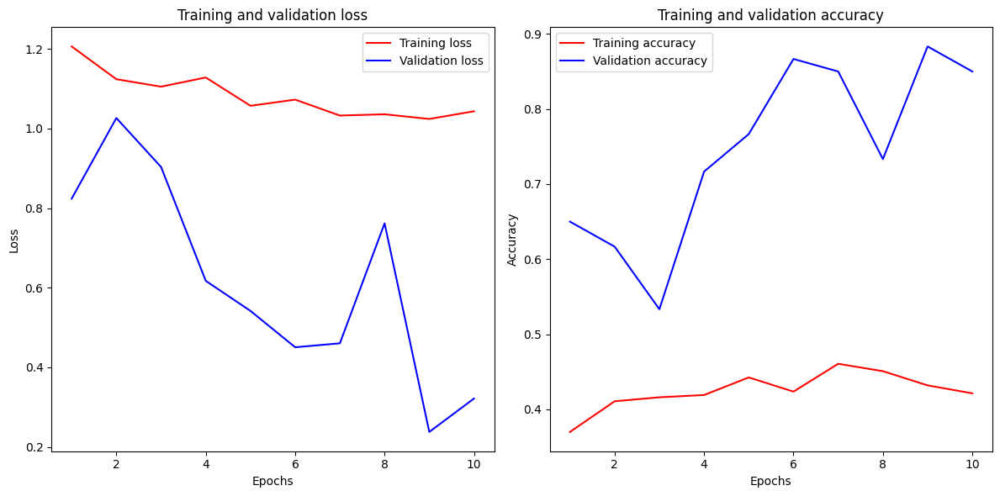

In [ ]:
import matplotlib.pyplot as plt

def plot_curves(loss, val_loss, accuracy, val_accuracy):
    epochs = range(1, len(loss) + 1)

    plt.figure(figsize=(12, 6))

    # Plot loss
    plt.subplot(1, 2, 1)
    plt.plot(epochs, loss, 'r', label='Training loss')
    plt.plot(epochs, val_loss, 'b', label='Validation loss')
    plt.title('Training and validation loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    # Plot accuracy
    plt.subplot(1, 2, 2)
    plt.plot(epochs, accuracy, 'r', label='Training accuracy')
    plt.plot(epochs, val_accuracy, 'b', label='Validation accuracy')
    plt.title('Training and validation accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.tight_layout()
    plt.show()

# Extract metrics from the history object
loss = history.history["loss"]
val_loss = history.history["val_loss"]
accuracy = history.history["accuracy"]
val_accuracy = history.history["val_accuracy"]

plot_curves(loss, val_loss, accuracy, val_accuracy)

In [ ]:
class_names

['Healthy', 'Powdery', 'Rust']

1/1 [==============================] - 0s 19ms/step


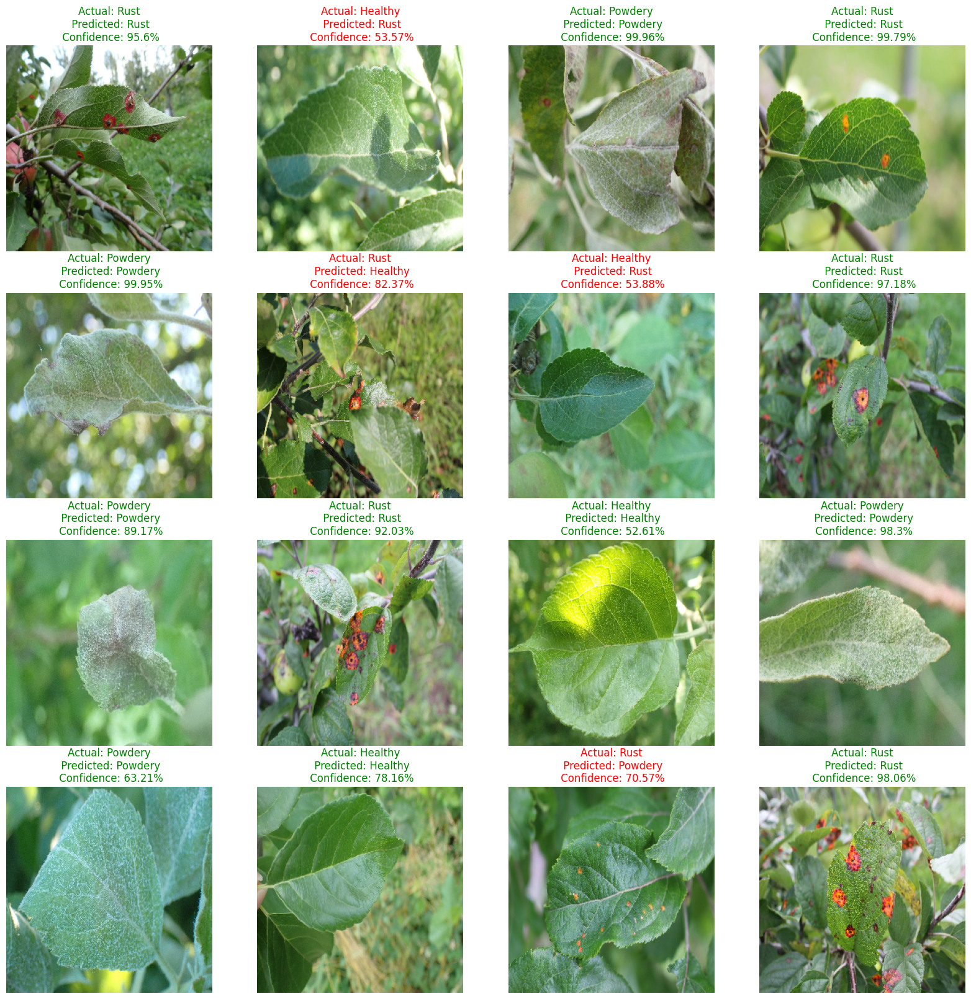

In [ ]:
plt.figure(figsize=(20, 25))
num_images_to_display = min(20, len(images))
for i in range(num_images_to_display):
    ax = plt.subplot(5, 4, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    actual_class = class_names[labels[i]]

    predicted_class, confidence = Prediction(model, images[i].numpy())
    if predicted_class == actual_class:
        title_color = 'green'
    else:
        title_color = 'red'

    plt.title(f"Actual: {actual_class}\n Predicted: {predicted_class}\n Confidence: {confidence}%", color=title_color)
    plt.axis("off")

# Fine Tuning of VGG16

we're fine-tuning the pre-trained VGG16 model to better suit our specific classification task. Here's what each part does:

 1.   Freezing Layers: We start by freezing certain layers of the VGG16 model. This means we prevent them from being updated during training to preserve the knowledge they've already learned from the original ImageNet dataset. We do this in two phases:

  *      First Phase: We freeze most of the layers except for the last few. This allows us to train the last layers to adapt the model to our specific dataset.

  *      Second Phase: We freeze more layers, keeping only a few towards the end unfrozen. This allows us to fine-tune the model even further while still leveraging the pre-trained weights.

 2. Learning Rate Adjustment: We adjust the learning rate for each phase of fine-tuning. A higher learning rate is used initially to allow the model to quickly adapt to our data. Then, a lower learning rate is used for finer adjustments in the second phase.

 3.   Compiling the Model: For each phase, we compile the model with the appropriate settings including the loss function, optimizer, and metrics.

 4.   Training the Model: We then train the model for each phase. During training, we monitor its performance on both the training and validation data to ensure it's learning effectively without overfitting.

In [ ]:
# Fine-tuning the first set of layers
fine_tune_at_first = 2

# Freeze all the layers before the `fine_tune_at_first` layer
for layer in model.layers[:fine_tune_at_first]:
    layer.trainable = False

# Define loss, optimizer, and metrics for the first fine-tuning phase
loss_first = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)
optimizer_first = tf.keras.optimizers.Nadam(learning_rate=0.1 * base_learning_rate)
metrics_first = ['accuracy']

# Compile the model for the first fine-tuning phase
model.compile(loss=loss_first,
              optimizer=optimizer_first,
              metrics=metrics_first)

# Fine-tuning the second set of layers
fine_tune_at_second = 5

# Freeze all the layers before the `fine_tune_at_second` layer
for layer in model.layers[:fine_tune_at_second]:
    layer.trainable = False

# Define loss, optimizer, and metrics for the second fine-tuning phase
optimizer_second = tf.keras.optimizers.Nadam(learning_rate=0.001)

# Define the number of fine-tune epochs
fine_tune_epochs = 4

# Total number of epochs for the second fine-tuning phase
total_epochs_second = initial_epochs + fine_tune_epochs

# Compile the model for the second fine-tuning phase
model.compile(loss=loss_first,
               optimizer=optimizer_second,
               metrics=metrics_first)

# Fit the model for the second fine-tuning phase
history_fine = model.fit(train_data,
                          epochs=total_epochs_second,
                          initial_epoch=history.epoch[-1],
                          validation_data=validation_data)

Epoch 10/14
83/83 [==============================] - 189s 554ms/step - loss: 0.9849 - accuracy: 0.4667 - val_loss: 0.3216 - val_accuracy: 0.8500
Epoch 11/14
83/83 [==============================] - 54s 592ms/step - loss: 1.0144 - accuracy: 0.4486 - val_loss: 0.3216 - val_accuracy: 0.8500
Epoch 12/14
83/83 [==============================] - 61s 664ms/step - loss: 0.9721 - accuracy: 0.4713 - val_loss: 0.3216 - val_accuracy: 0.8500
Epoch 13/14
83/83 [==============================] - 50s 553ms/step - loss: 0.9730 - accuracy: 0.4788 - val_loss: 0.3216 - val_accuracy: 0.8500
Epoch 14/14
83/83 [==============================] - 57s 616ms/step - loss: 0.9970 - accuracy: 0.4622 - val_loss: 0.3216 - val_accuracy: 0.8500


# Results with Fine Tunning

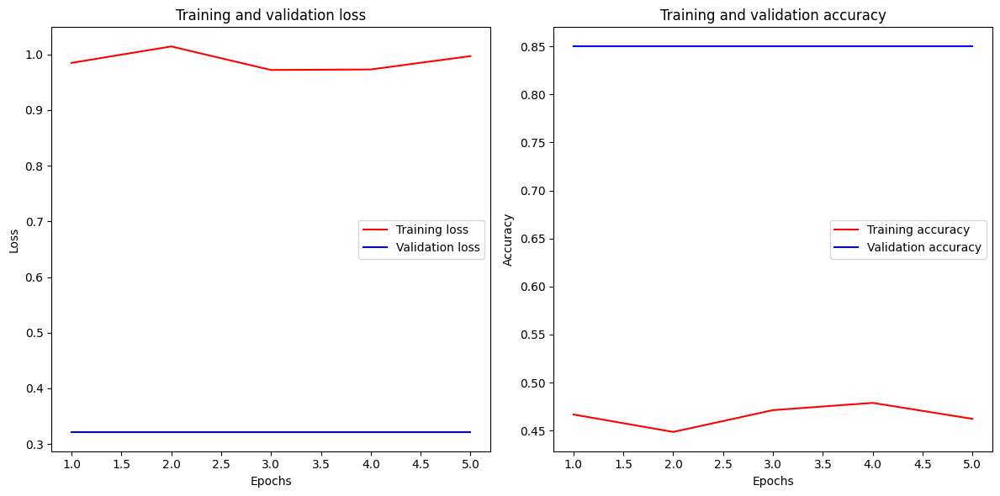

In [ ]:
# Extract metrics from the history object
loss = history_fine.history["loss"]
val_loss = history_fine.history["val_loss"]
accuracy = history_fine.history["accuracy"]
val_accuracy = history_fine.history["val_accuracy"]


# Call the plot_curves function with the extracted metrics
plot_curves(loss, val_loss, accuracy, val_accuracy)

The results from fine-tuning the VGG16 model didn't meet our expectations. Despite our efforts, we didn't see significant improvement. It's crucial to monitor the CNN layers and carefully adjust training parameters like the optimizer, learning rate, epochs, and batch size.

Rather than endlessly tweaking these parameters, we've decided to switch to a more robust model in pursuit of better results.

# Starting ResNet101V2

ResNet101V2 is a variant of the ResNet (Residual Network) architecture, which is a deep convolutional neural network (CNN) used for image classification and other computer vision tasks. Specifically, ResNet101V2 refers to a ResNet model with 101 layers. The "V2" denotes that it is an updated version of the original ResNet architecture, incorporating improvements in training stability and performance. ResNet models are known for their ability to effectively train very deep neural networks by using skip connections or residual connections, which help alleviate the vanishing gradient problem. This architecture has been pre-trained on large-scale image datasets like ImageNet and is commonly used in transfer learning for various computer vision applications.

![ResNet101V2 and ResNet152V2 architecture](https://www.researchgate.net/publication/353225711/figure/fig4/AS:1115969611145219@1643079297270/ResNet101V2-and-ResNet152V2-architecture-with-extra-layers-added-at-the-end-for.png)


In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import ResNet101V2
from tensorflow.keras.layers import Dense, Dropout, Flatten, Input, LeakyReLU, BatchNormalization, Activation, Conv2D

In [ ]:
train_datagen=ImageDataGenerator(rescale=1/255)
test_datagen=ImageDataGenerator(rescale=1/255)

In [ ]:
training_set = train_datagen.flow_from_directory(
    train_folder,
    target_size = (IMG_SIZE,IMG_SIZE),
    batch_size = 48,
    class_mode = 'categorical')

val_set = test_datagen.flow_from_directory(
    validation_folder,
    target_size = (IMG_SIZE,IMG_SIZE),
    batch_size = 48,
    class_mode = 'categorical')

Found 1322 images belonging to 3 classes.
Found 60 images belonging to 3 classes.


In [ ]:
modelr=ResNet101V2(input_shape=(IMG_SIZE,IMG_SIZE,CHANNELS),weights='imagenet',include_top=False)
for layer in modelr.layers:
    layer.trainable=False

In [ ]:
modelr.summary()

Model: "resnet101v2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 262, 262, 3)          0         ['input_2[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 128, 128, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 pool1_pad (ZeroPadding2D)   (None, 130, 130, 64)         0         ['conv1_conv[0][0]']          
                                                                                        

#Plant model with ResNet101V2

We added additional layers, including dropout for regularization, batch normalization for stability, and dense layers for classification, to enhance the ResNet101V2 model's performance and adapt it to our specific classification task of identifying plant conditions (Rust, Powdery, Healthy).

In [ ]:
model=Sequential()
model.add(modelr)
model.add(Dropout(0.2))
model.add(Flatten())
model.add(BatchNormalization())
model.add(Dense(1024,kernel_initializer='he_uniform'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(512,kernel_initializer='he_uniform'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(3,activation='softmax'))
print(model.summary())

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet101v2 (Functional)    (None, 8, 8, 2048)        42626560  
                                                                 
 dropout_3 (Dropout)         (None, 8, 8, 2048)        0         
                                                                 
 flatten_1 (Flatten)         (None, 131072)            0         
                                                                 
 batch_normalization_3 (Bat  (None, 131072)            524288    
 chNormalization)                                                
                                                                 
 dense_3 (Dense)             (None, 1024)              134218752 
                                                                 
 batch_normalization_4 (Bat  (None, 1024)              4096      
 chNormalization)                                     

In [ ]:
optimizer=tf.keras.optimizers.Adam(learning_rate=0.001)
model.compile(
  loss='categorical_crossentropy',
  optimizer=optimizer,
  metrics=['accuracy']
)

In [ ]:
history = model.fit(
  training_set,
  validation_data=val_set,
  epochs=4,
  steps_per_epoch=len(training_set),
  validation_steps=len(val_set)
)

Epoch 1/4
28/28 [==============================] - 847s 30s/step - loss: 0.3393 - accuracy: 0.8858 - val_loss: 0.4416 - val_accuracy: 0.9500
Epoch 2/4
28/28 [==============================] - 826s 29s/step - loss: 0.0700 - accuracy: 0.9826 - val_loss: 0.5332 - val_accuracy: 0.9500
Epoch 3/4
28/28 [==============================] - 838s 30s/step - loss: 0.0242 - accuracy: 0.9909 - val_loss: 0.3024 - val_accuracy: 0.9500
Epoch 4/4
28/28 [==============================] - 815s 29s/step - loss: 0.0125 - accuracy: 0.9977 - val_loss: 0.2026 - val_accuracy: 0.9500


# Results with ResNet101V2

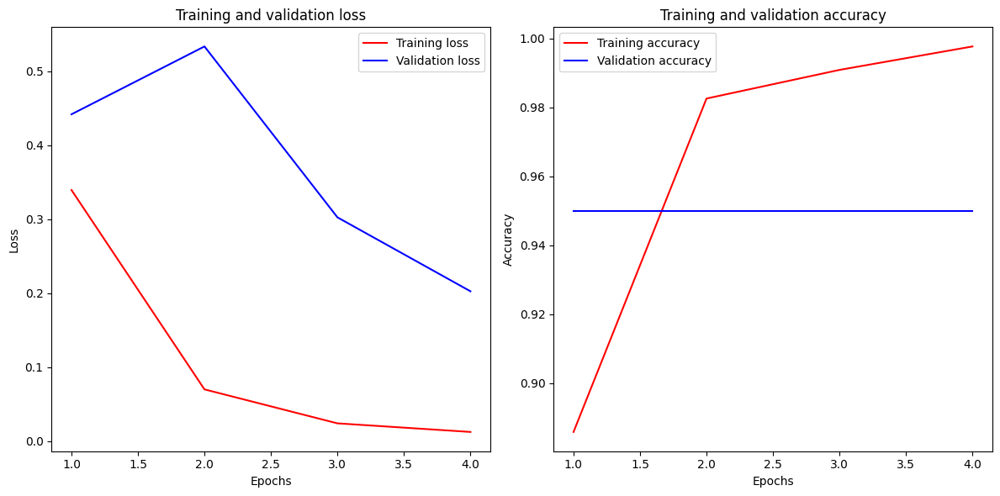

In [ ]:
# Extract metrics from the history object
loss = history.history["loss"]
val_loss = history.history["val_loss"]
accuracy = history.history["accuracy"]
val_accuracy = history.history["val_accuracy"]


# Call the plot_curves function with the extracted metrics
plot_curves(loss, val_loss, accuracy, val_accuracy)

1/1 [==============================] - 0s 467ms/step


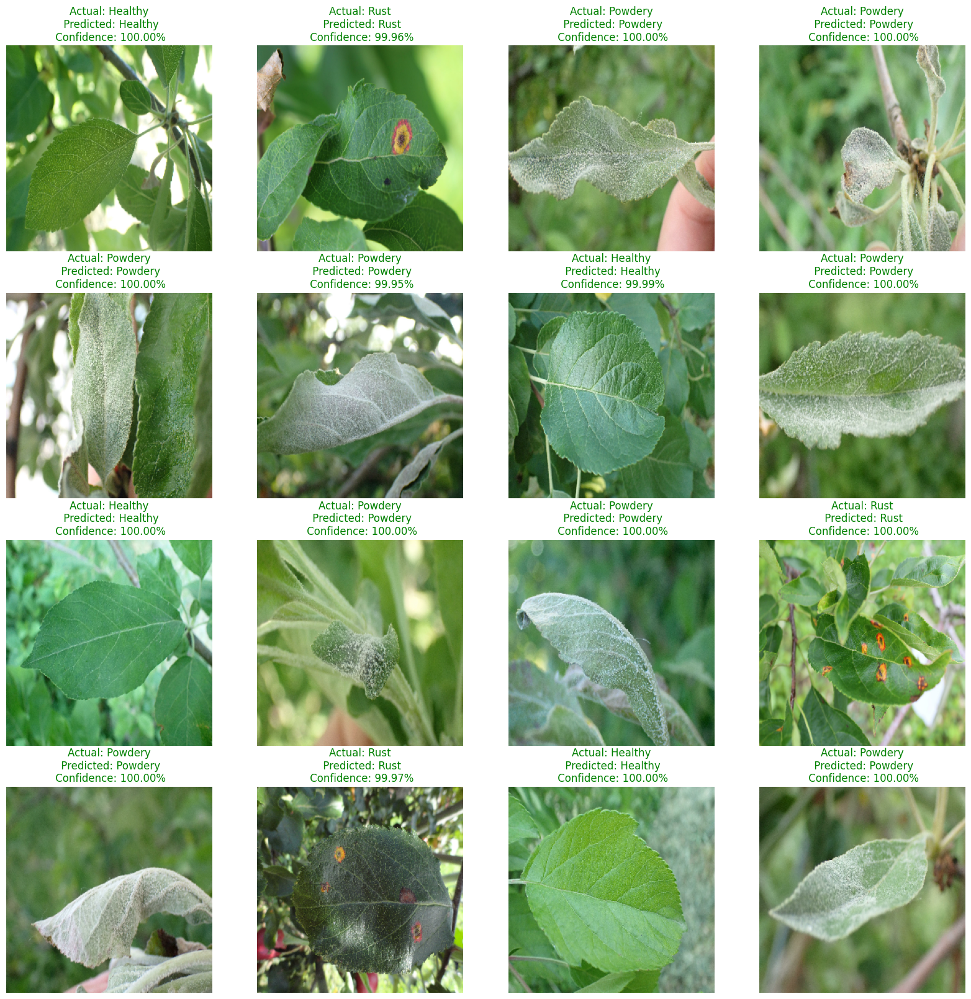

In [ ]:
from tensorflow.keras.preprocessing import image

plt.figure(figsize=(20, 25))

# Assuming you have a list of image tensors, labels, and class names
num_images_to_display = min(20, len(images))
for i in range(num_images_to_display):
    ax = plt.subplot(5, 4, i + 1)

    # Convert the image tensor to a numpy array
    img_array = images[i].numpy()

    # Convert the numpy array to a PIL image
    img_pil = image.array_to_img(img_array, scale=True)

    # Resize the image
    img_pil = img_pil.resize((IMG_SIZE, IMG_SIZE))

    # Convert PIL image to numpy array
    img_array = image.img_to_array(img_pil)
    img_array = np.expand_dims(img_array, axis=0)
    img_array /= 255.  # Normalize pixel values

    # Perform prediction
    predictions = model.predict(img_array)
    predicted_class_idx = np.argmax(predictions)
    predicted_class = class_names[predicted_class_idx]
    confidence = predictions[0][predicted_class_idx] * 100

    actual_class = class_names[labels[i]]

    if predicted_class == actual_class:
        title_color = 'green'
    else:
        title_color = 'red'

    plt.imshow(img_pil)
    plt.title(f"Actual: {actual_class}\n Predicted: {predicted_class}\n Confidence: {confidence:.2f}%", color=title_color)
    plt.axis("off")

plt.show()

#Conclusion

There are several parameters to consider for a CNN model. In this study, we showcased the utilization of two models and the fine-tuning process. Altering CNN layers can enhance the model's ability to learn our data while minimizing information loss. Additionally, adjustments to parameters such as epochs, batch size, and learning rate can aid in model learning.

During fine-tuning, we selectively froze and unfroze portions of the model to train with varying parameters, facilitating better adaptation to new data insights. Our findings indicated the ResNet101V2 model as the top performer. As a more robust model, we anticipated superior performance with fewer epochs. Indeed, when evaluated on test data, the ResNet101V2 model accurately predicted all images with confidence.

This project lays a foundation for future CNN models and provides insights for optimizing CNN performance.